In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
# Import necessary packages
import os
import numpy as np
import glob as gb
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image


import tensorflow as tf
import tensorflow.keras.layers as tfl
from tensorflow.keras import layers, models, optimizers, losses
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers.experimental.preprocessing import *
sns.set()
%matplotlib inline

# Data Exploration

In [4]:
# Define the directories for the data
direc = '/kaggle/input/shoes-for-image-classification-mixed/Shoes for Image Classification mixed/'

In [5]:
#Path for new data to predict
test_dir = '/kaggle/input/prediction/Predictions'

In [6]:
# Loop through each folder in the directory
for folder in os.listdir(direc):
    
    # Use glob to find all images in the current folder
    files = gb.glob(direc + folder + '/*.[jJ][pP][gG]')
    
    # Print out the number of images found in the current folder
    print(f'Found {len(files)} JPG files in folder {folder}.')

Found 288 JPG files in folder nike.
Found 287 JPG files in folder adidas.


In [7]:
# List to store the dimensions of each image
size = []

# Loop over each folder in the directory
for folder in os.listdir(direc):
    
    # Find all images that in the current folder
    files = gb.glob(pathname=str(direc + folder + '/*.[jJ][pP][gG]'))
    
    # Loop over each image in the folder
    for file in files: 
        
        # Read the image and append its dimensions to the size list
        image = plt.imread(file)
        size.append(image.shape)

# Print the total number of images and their dimension frequencies
print(f'The Total images we have: {len(size)}')
print(pd.Series(size).value_counts())

The Total images we have: 575
(224, 224, 3)      529
(224, 224, 4)       10
(401, 300, 3)        5
(800, 600, 3)        4
(546, 970, 3)        2
(240, 240, 3)        2
(250, 250, 3)        2
(650, 880, 3)        1
(676, 1200, 4)       1
(340, 510, 3)        1
(796, 640, 3)        1
(225, 400, 3)        1
(300, 285, 3)        1
(725, 966, 3)        1
(300, 250, 3)        1
(483, 700, 3)        1
(1920, 2560, 3)      1
(198, 332, 3)        1
(705, 1253, 3)       1
(825, 1625, 4)       1
(500, 375, 3)        1
(497, 651, 4)        1
(683, 683, 3)        1
(540, 540, 3)        1
(248, 250, 3)        1
(218, 332, 3)        1
(230, 332, 3)        1
(1124, 1686, 3)      1
dtype: int64


In [8]:
# Create an empty set to hold the unique image formats
formats = set()

# Loop through each folder in the directory
for folder in  os.listdir(direc) : 
    # Use glob to get all images in the folder
    images = gb.glob(pathname= str( direc + folder + '/*.[jJ][pP][gG]'))
    
    # Loop through each image in the folder
    for image_path in images: 
        # Use the Image module from the Pillow library to open the image
        with Image.open(image_path) as image:
            # Add the image format to the set of formats
            formats.add(image.format)

# Print the set of image formats
print(formats)

{'PNG', 'WEBP', 'JPEG'}


Not all image have the same format type and we can't handle WEBP format so, we're going to convert all of images to be JPEG format.

# Data Preparation

In [10]:
# Create new directory if it doesn't exist
directory = '/kaggle/working/shoes-for-image-classification-mixed/Shoes for Image Classification mixed/'
if not os.path.exists(directory):
    os.makedirs(directory)

# Loop through directories in the source directory
for folder in os.listdir(direc):
    folder_path = os.path.join(direc, folder)
  
    # Loop through files in the directory
    for file in os.listdir(folder_path):
        file_path = os.path.join(folder_path, file)
        
        # If the file is a JPG or PNG image, save it as a JPG file in the new directory
        if file.lower().endswith(('.jpg', '.jpeg', '.png')):
            output_path = os.path.join(directory, folder, os.path.splitext(file)[0] + '.jpg')
            if not os.path.exists(os.path.join(directory, folder)):
                os.makedirs(os.path.join(directory, folder))
            with Image.open(file_path) as image:
                image.convert('RGB').save(output_path, 'JPEG')
        
        # If the file is not a JPG or PNG image, save it as a JPG file in the new directory after converting to RGB format
        else:
            output_path = os.path.join(directory, folder, os.path.splitext(file)[0] + '.jpg')
            if not os.path.exists(os.path.join(directory, folder)):
                os.makedirs(os.path.join(directory, folder))
            with Image.open(file_path) as image:
                image.convert('RGB').save(output_path, 'JPEG')

In [11]:
# create an empty set to store unique image formats
img_format= set()

# iterate through each folder in the directory
for folder in os.listdir(directory):
    
    # find all image files in the folder with .jpg or .jpeg or .png extension
    images = gb.glob(pathname=str(directory + folder + '/*.[jJ][pP][gG]'))
    
    # iterate through each image file in the folder
    for image_path in images:
        
        # open the image file and get its format
        with Image.open(image_path) as image:
            img_format.add(image.format)
            
# print the unique image formats found in the directory
print(img_format)

{'JPEG'}


All the images has JPEG format now.

# Data Splitting

In [71]:
# Define batch size and image size
BATCH_SIZE = 32
IMG_SIZE = (224, 224)

# Create training dataset using image_dataset_from_directory
train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    directory,                           # directory containing the images
    batch_size=BATCH_SIZE,               # number of samples per batch
    image_size=IMG_SIZE,                 # size of the images
    validation_split=0.2,                # fraction of the data to use as validation set
    subset='training',                   # type of data subset to generate (training set)
    shuffle=True,                        # shuffle the data
    seed=30                              # random seed for shuffling the data
)

# Create validation dataset using image_dataset_from_directory
val_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    directory,                           # directory containing the images
    batch_size=BATCH_SIZE,               # number of samples per batch
    image_size=IMG_SIZE,                 # size of the images
    validation_split=0.2,                # fraction of the data to use as validation set
    subset='validation',                 # type of data subset to generate (validation set)
    shuffle=True,                        # shuffle the data
    seed=30                              # random seed for shuffling the data
)

Found 575 files belonging to 2 classes.
Using 460 files for training.
Found 575 files belonging to 2 classes.
Using 115 files for validation.


In [14]:
test_data = ImageDataGenerator(
    rescale=1./255             # Rescale pixel values to [0, 1]
).flow_from_directory(
    test_dir,                  # Directory of test set images
    shuffle=True,              # Shuffle the order of the images
    seed=30,                   # Set a random seed for reproducibility
    batch_size=BATCH_SIZE,     # Number of images to include in each batch
    target_size=IMG_SIZE,      # Resize images to a fixed size
    class_mode='binary',       # Type of labels to return (binary for binary classification)
    interpolation='bilinear',  # Interpolation method for image resizing
    color_mode='rgb'           # Color mode of the images (RGB in this case)
)

Found 22 images belonging to 2 classes.


# Check Labels

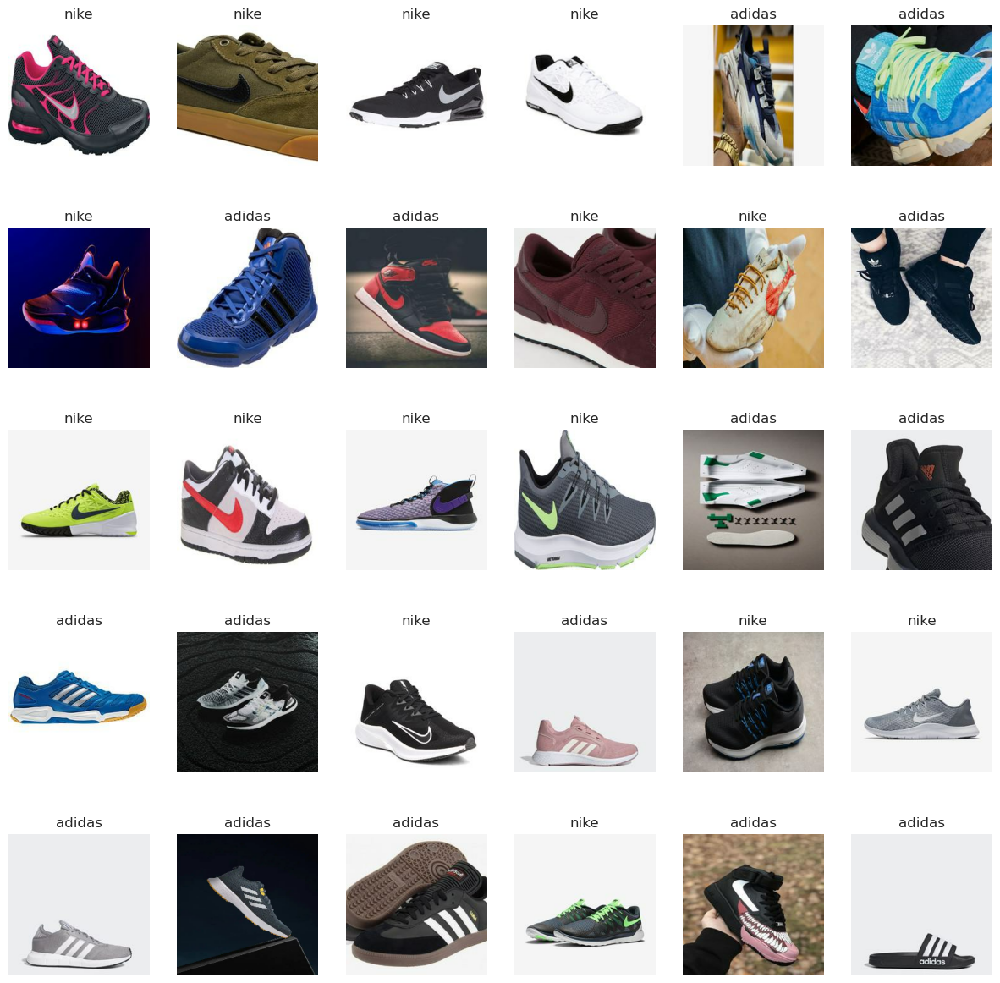

In [15]:
# Get the class names from the training dataset
class_names = train_dataset.class_names

# Create a plot to display sample images from the training dataset
plt.figure(figsize=(15,15))
for images, labels in train_dataset.take(1):
    for i in range(30):
        ax = plt.subplot(5,6, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

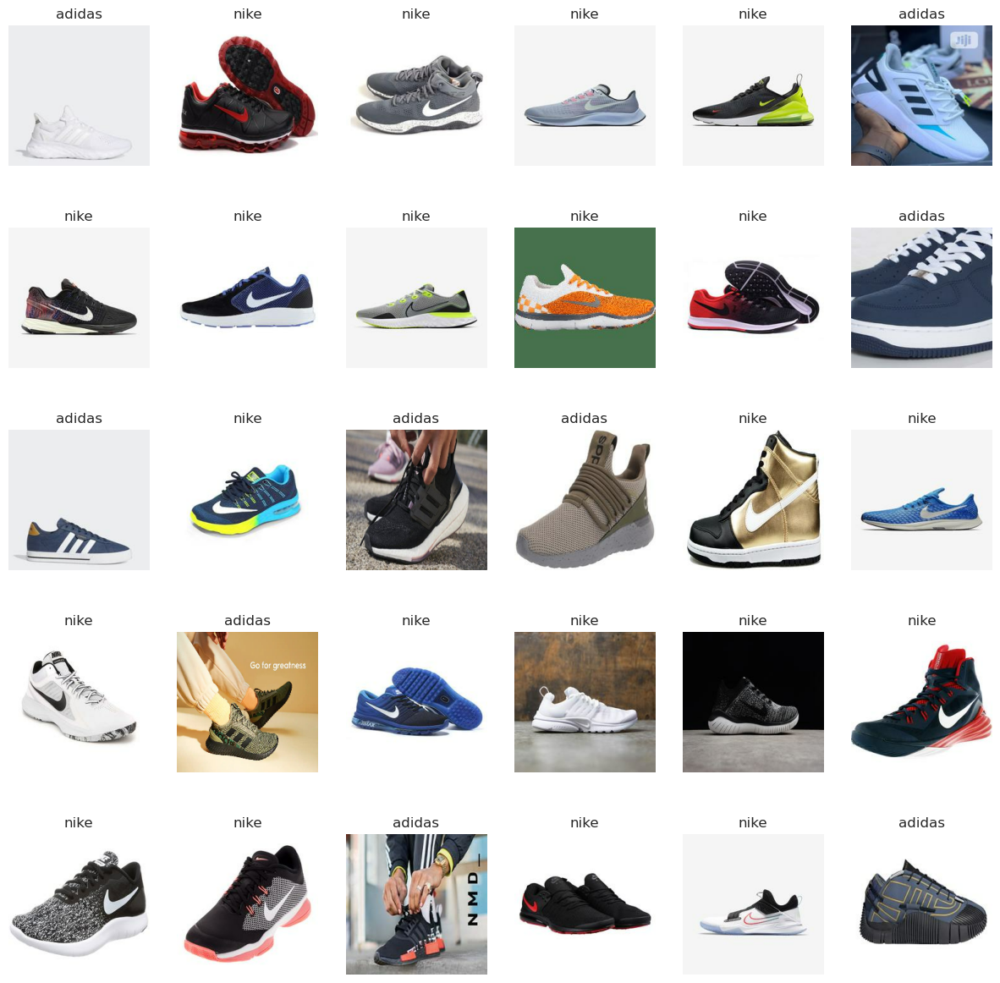

In [16]:
# Get the class names from the validation dataset
class_names = val_dataset.class_names

# Create a plot to display sample images from the validation dataset
plt.figure(figsize=(15,15))
for images, labels in val_dataset.take(1):
    for i in range(30):
        ax = plt.subplot(5,6, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

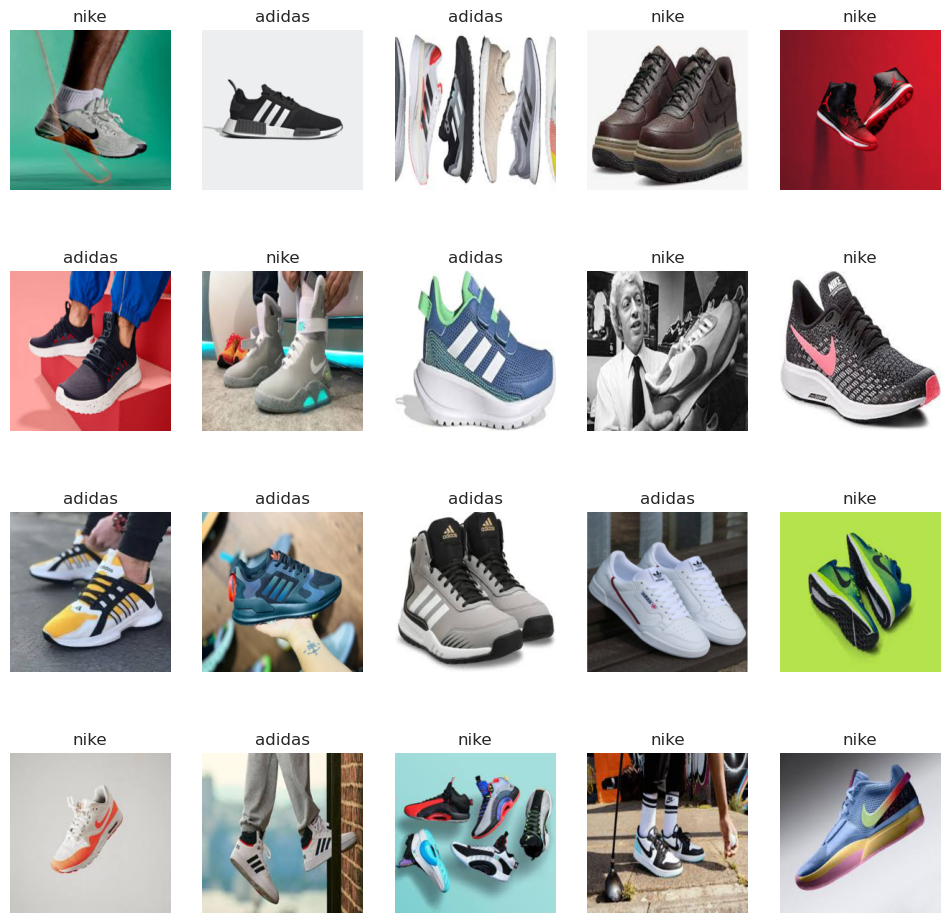

In [17]:
class_names = test_data.class_indices                   # Retrieve class indices from the testing data generator
class_names = {v: k for k, v in class_names.items()}    # Reverse the mapping of class indices to class names


# Create a 5x6 grid of sample images and their labels from the testing data
plt.figure(figsize=(12, 12))
for images, labels in test_data:
    for i in range(20):
        ax = plt.subplot(4, 5, i+1)
        plt.imshow(images[i])
        plt.title(class_names[int(labels[i])])
        plt.axis("off")
    break

# Data Augmentation


In [83]:
#Make a Function to make Data Augmentation reuse it whenever we want
def data_augmenter():
    #Create a Sequential model composed of 2 layers
    data_augmentation = tf.keras.Sequential([
        RandomFlip ("horizontal_and_vertical", input_shape=(224, 224, 3)),
        RandomRotation(0.2),
        RandomCrop(150, 150),
        RandomContrast(0.2),
    ])   
    return data_augmentation

In [84]:
# Set the AUTOTUNE buffer size to enable dynamic prefetching.
AUTOTUNE = tf.data.experimental.AUTOTUNE

# Prefetch the training dataset using the AUTOTUNE buffer size.
train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)

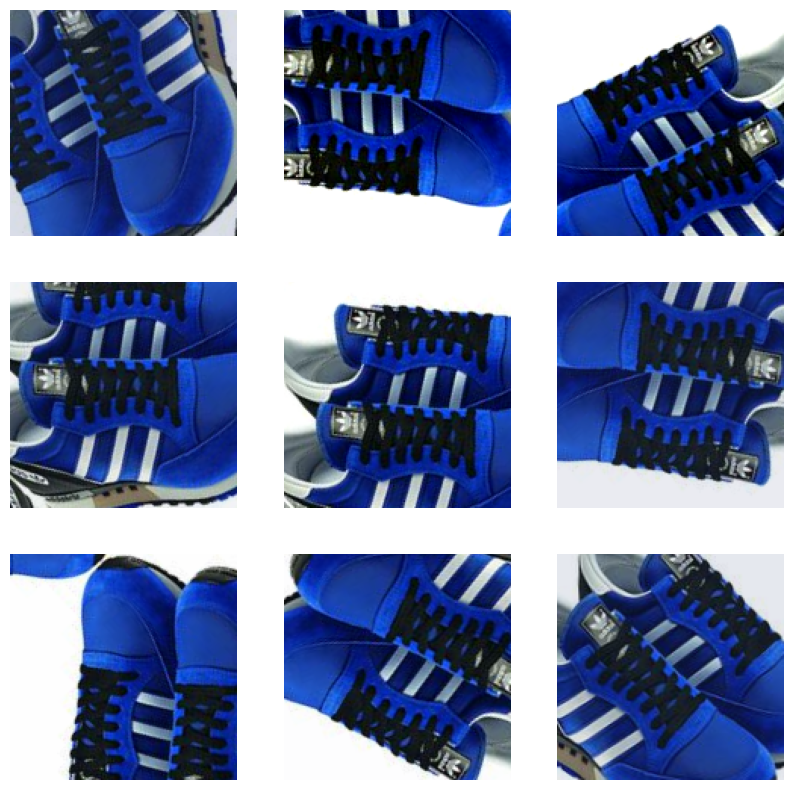

In [22]:
# Define data augmentation function
data_augmentation = data_augmenter()

# Take one batch of images from the train_dataset
for image, _ in train_dataset.take(1):
    # Create a figure with 3 rows and 3 columns to display augmented images
    plt.figure(figsize=(10, 10))
    
    # Select the first image from the batch
    first_image = image[0]
    
    # Generate and display 9 augmented versions of the first image
    for i in range(9):
        # Create a subplot for each augmented image
        ax = plt.subplot(3, 3, i + 1)
        
        # Apply data augmentation to the first image and display the augmented image
        augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
        plt.imshow(augmented_image[0] / 255) # Divide by 255 to scale pixel values from [0, 255] to [0, 1]
        
        # Remove axis labels from the plot
        plt.axis('off')

# CNN Model

In [20]:
# Define the input shape of the images
input_shape = (224, 224, 3)

# Define the model architecture
CNN = tf.keras.Sequential([

    # Convolutional layers with ReLU activation and max pooling
    tf.keras.layers.Conv2D(32, (5, 5), activation="relu", padding='same', input_shape=input_shape),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Conv2D(64, (3, 3), activation="relu", padding='same'),
    tf.keras.layers.MaxPool2D(),  
    tf.keras.layers.Conv2D(128, (3, 3), activation="relu", padding='same'),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),
    tf.keras.layers.GlobalMaxPool2D(),
    
    # Flatten and fully connected layers with ReLU activation and dropout regularization
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(720, activation='relu'),
    tf.keras.layers.Dropout(0.1),
    tf.keras.layers.Dense(1, activation='sigmoid')
    ])

# Print a summary of the model architecture
print(CNN.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 32)      2432      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 56, 56, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 56, 56, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 28, 28, 128)      0

Number of layers in the base model:  12


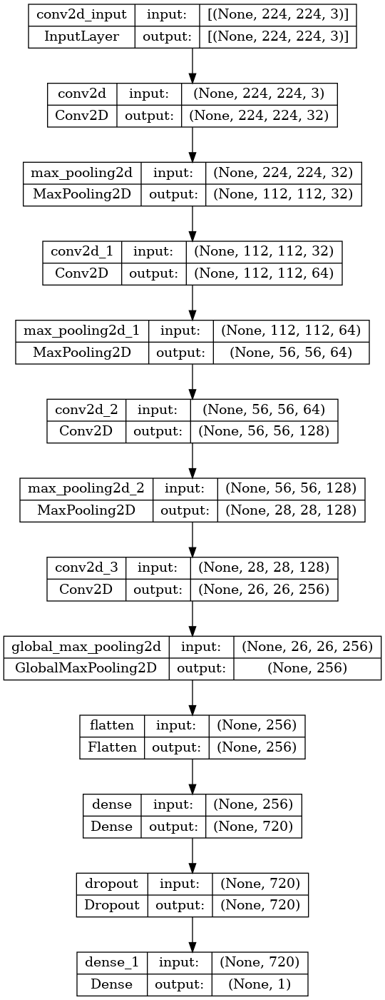

In [21]:
print("Number of layers in the base model: ", len(CNN.layers))

# Import the required library
from keras.utils.vis_utils import plot_model

# Visualize the model architecture and save the plot as an image
plot_model(CNN, show_shapes=True, show_layer_names=True)

In [24]:
# Compile the model
CNN.compile(
    loss=tf.keras.losses.BinaryCrossentropy(from_logits=False),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    metrics=['accuracy'],
    run_eagerly=True
)

In [30]:
epochs = 10      # Set the number of epochs for training

# Train the model
#train model
history = CNN.fit(train_dataset,
                    epochs=epochs,
                    validation_data=val_dataset)

Epoch 1/10
15/15 [==============================] - 40s 3s/step - loss: 4.3797 - accuracy: 0.5196 - val_loss: 1.3842 - val_accuracy: 0.5130
Epoch 2/10
15/15 [==============================] - 37s 2s/step - loss: 1.7265 - accuracy: 0.5696 - val_loss: 0.8386 - val_accuracy: 0.6609
Epoch 3/10
15/15 [==============================] - 38s 3s/step - loss: 1.5953 - accuracy: 0.5717 - val_loss: 1.0093 - val_accuracy: 0.5130
Epoch 4/10
15/15 [==============================] - 37s 2s/step - loss: 1.4440 - accuracy: 0.5457 - val_loss: 0.8727 - val_accuracy: 0.4957
Epoch 5/10
15/15 [==============================] - 37s 2s/step - loss: 0.8726 - accuracy: 0.6630 - val_loss: 0.6625 - val_accuracy: 0.7043
Epoch 6/10
15/15 [==============================] - 37s 2s/step - loss: 0.9544 - accuracy: 0.6609 - val_loss: 0.6696 - val_accuracy: 0.6087
Epoch 7/10
15/15 [==============================] - 38s 3s/step - loss: 0.6669 - accuracy: 0.7217 - val_loss: 0.6042 - val_accuracy: 0.6348
Epoch 8/10
15/15 [==

# CNN Model Evaluation

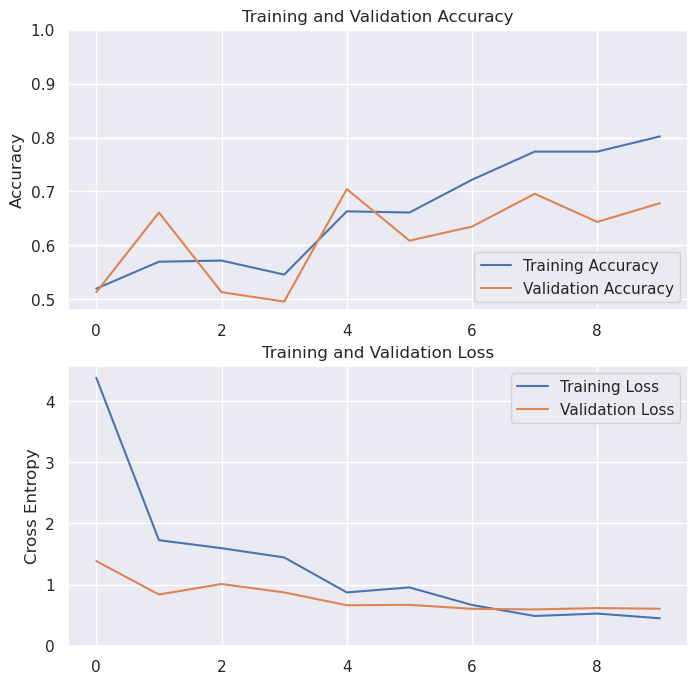

In [31]:
# Extract training and validation accuracy
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# Extract training and validation loss
loss = history.history['loss']
val_loss = history.history['val_loss']

# ________________ Graph 1 -------------------------

# Plot training and validation accuracy
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()), 1])
plt.title('Training and Validation Accuracy')

# ________________ Graph 2 -------------------------

# Plot training and validation loss
plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0, max(plt.ylim())])
plt.title('Training and Validation Loss')
plt.show()

In [119]:
#Add more 5 epochs
more_epochs = 5
total_epochs =  epochs + more_epochs
#Train model on more 5 epochs
history_More = CNN.fit(train_dataset,
                         epochs=total_epochs,
                         initial_epoch=history.epoch[-1],
                         validation_data=val_dataset,)

Epoch 4/15
15/15 [==============================] - 38s 2s/step - loss: 0.1375 - accuracy: 0.9609 - val_loss: 0.5641 - val_accuracy: 0.7304
Epoch 5/15
15/15 [==============================] - 37s 2s/step - loss: 0.1267 - accuracy: 0.9696 - val_loss: 0.5965 - val_accuracy: 0.7304
Epoch 6/15
15/15 [==============================] - 38s 3s/step - loss: 0.1102 - accuracy: 0.9739 - val_loss: 0.5916 - val_accuracy: 0.7304
Epoch 7/15
15/15 [==============================] - 38s 3s/step - loss: 0.1831 - accuracy: 0.9370 - val_loss: 0.8406 - val_accuracy: 0.6957
Epoch 8/15
15/15 [==============================] - 38s 3s/step - loss: 0.1666 - accuracy: 0.9304 - val_loss: 0.9571 - val_accuracy: 0.5739
Epoch 9/15
15/15 [==============================] - 38s 2s/step - loss: 0.0964 - accuracy: 0.9761 - val_loss: 0.5474 - val_accuracy: 0.7565
Epoch 10/15
15/15 [==============================] - 37s 2s/step - loss: 0.0643 - accuracy: 0.9870 - val_loss: 0.6066 - val_accuracy: 0.7304
Epoch 11/15
15/15 [

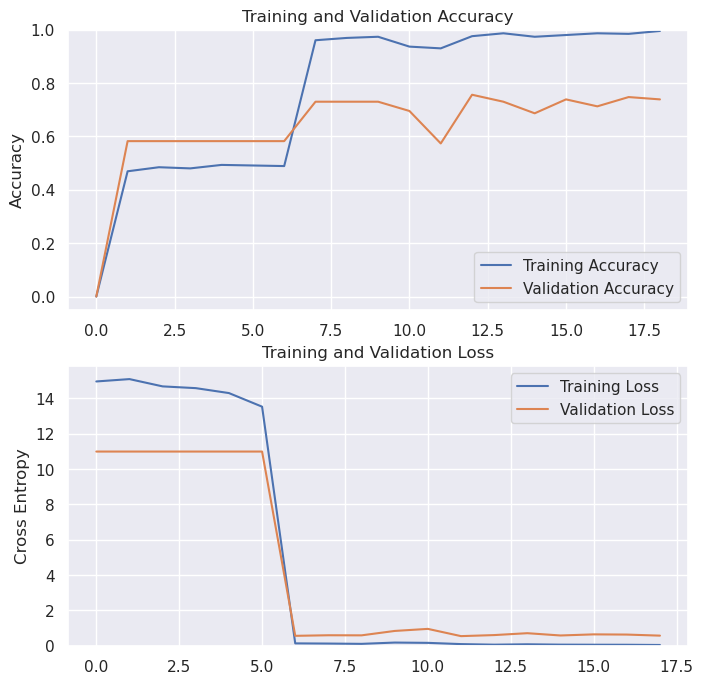

In [120]:
# Extract training and validation accuracy
acc += history_More.history['accuracy']
val_acc += history_More.history['val_accuracy']

# Extract training and validation loss
loss += history_More.history['loss']
val_loss += history_More.history['val_loss']

# ________________ Graph 1 -------------------------

# Plot training and validation accuracy
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()), 1])
plt.title('Training and Validation Accuracy')

# ________________ Graph 2 -------------------------

# Plot training and validation loss
plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0, max(plt.ylim())])
plt.title('Training and Validation Loss')
plt.show()

In [121]:
# Evaluate the model on the test dataset
CNN.evaluate(test_data)

1/1 [==============================] - 1s 673ms/step - loss: 0.6920 - accuracy: 0.5455


[0.6920118927955627, 0.5454545617103577]

# CNN Model Generalization

1/1 [==============================] - 0s 56ms/step


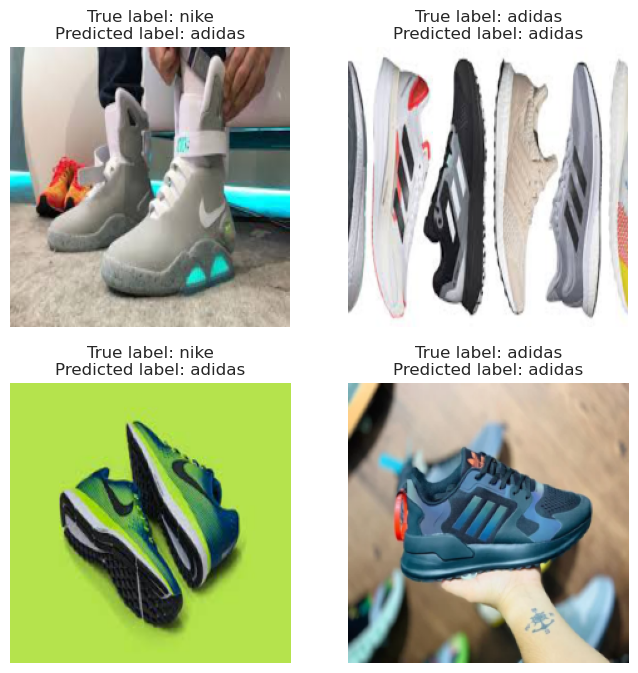

In [122]:
# Generate predictions for number of examples from the test set
num_examples = 4
x, y_true = test_data.next()
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(8, 8))
for i in range(num_examples):
    # Get a random image and its corresponding label from the test set
    x_test = x[i]
    y_true_test = y_true[i]

    # Get the model's prediction for the random image
    y_pred_test = CNN.predict(np.expand_dims(x_test, axis=0))[0]
    
    true_label = class_names[int(y_true_test)]
    predicted_label = class_names[int(np.argmax(y_pred_test))]

    # Plot the image and predicted label in a subplot
    ax[i//2, i%2].imshow(x_test)
    ax[i//2, i%2].axis('off')
    ax[i//2, i%2].set_title(f"True label: {true_label}\nPredicted label: {predicted_label}");

plt.show()

We will try tansfer learning.

# **ResNET Model**

**Model Building**

In [42]:
# Define the base model
base_model = tf.keras.applications.ResNet152(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze all layers in the base model
for layer in base_model.layers:
    layer.trainable = False

# Add new layers to the model
x = layers.Flatten()(base_model.output)
x = layers.Dense(1000, activation='relu')(x)
predictions = layers.Dense(10, activation='softmax')(x)
head_model = Model(inputs=base_model.input, outputs=predictions)

# Print the number of layers in the base model
print("Number of layers in the base model: ", len(base_model.layers))

234698864/234698864 [==============================] - 7s 0us/step
Number of layers in the base model:  515


In [49]:
#Compile Model
head_model.compile(optimizer='adam', loss=losses.sparse_categorical_crossentropy, metrics=['accuracy'])
head_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

**Model Architecture**

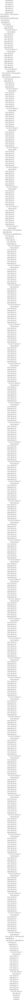

In [89]:
# Import the required library
from keras.utils.vis_utils import plot_model

# Visualize the model architecture and save the plot as an image
plot_model(head_model, show_shapes=True, show_layer_names=True)

In [51]:
# Define a learning rate scheduler that reduces the learning rate by a factor of 0.1 when the monitored metric plateaus
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(factor=0.1, patience=2)

# Define early stopping to stop training when monitored metric stops improving
# Here, the patience is set to 2, which means training will stop if the metric does not improve for 2 epochs
# restore_best_weights is set to False, which means that the weights at the end of the epoch with the best monitored metric won't be restored
early_stopping = tf.keras.callbacks.EarlyStopping(patience=2, restore_best_weights=True)

In [52]:
# Train model 
# Use early stopping and learning rate reduction callbacks
history = head_model.fit(train_dataset, epochs=9, validation_data=val_dataset,
                          callbacks=[lr_scheduler, early_stopping])

Epoch 1/9
15/15 [==============================] - 110s 7s/step - loss: 55.9368 - accuracy: 0.6565 - val_loss: 13.9892 - val_accuracy: 0.8174 - lr: 0.0010
Epoch 2/9
15/15 [==============================] - 97s 7s/step - loss: 11.7692 - accuracy: 0.8870 - val_loss: 10.6430 - val_accuracy: 0.8696 - lr: 0.0010
Epoch 3/9
15/15 [==============================] - 96s 6s/step - loss: 1.9183 - accuracy: 0.9674 - val_loss: 8.2762 - val_accuracy: 0.9130 - lr: 0.0010
Epoch 4/9
15/15 [==============================] - 98s 7s/step - loss: 2.0228 - accuracy: 0.9783 - val_loss: 11.0098 - val_accuracy: 0.8870 - lr: 0.0010
Epoch 5/9
15/15 [==============================] - 97s 7s/step - loss: 0.8038 - accuracy: 0.9913 - val_loss: 11.7195 - val_accuracy: 0.9043 - lr: 0.0010


# ResNET Evaluation

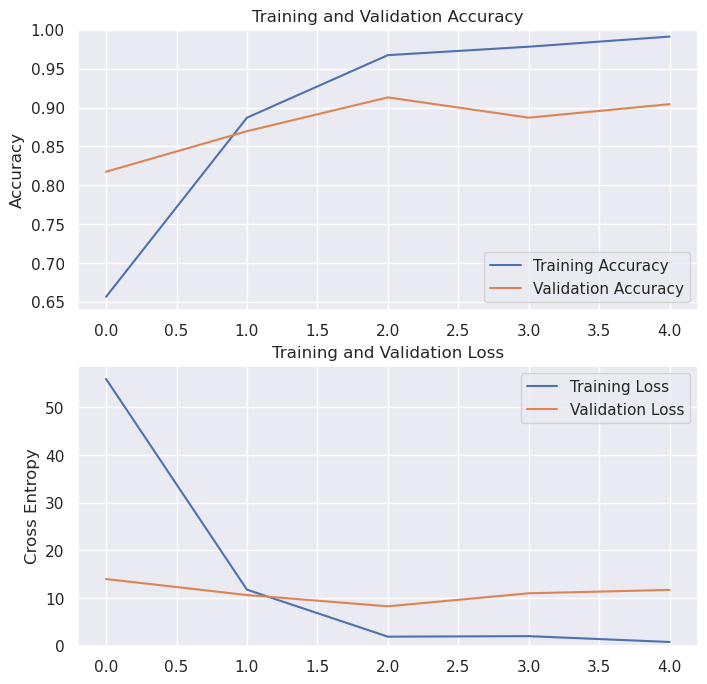

In [53]:
# Extract training and validation accuracy
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# Extract training and validation loss
loss = history.history['loss']
val_loss = history.history['val_loss']

# ________________ Graph 1 -------------------------

# Plot training and validation accuracy
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()), 1])
plt.title('Training and Validation Accuracy')

# ________________ Graph 2 -------------------------

# Plot training and validation loss
plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0, max(plt.ylim())])
plt.title('Training and Validation Loss')
plt.show()


In [61]:
# Evaluate the model on the test dataset
head_model.evaluate(test_data)

1/1 [==============================] - 4s 4s/step - loss: 14.8605 - accuracy: 0.4545


[14.860480308532715, 0.4545454680919647]

# **ResNet Model Generalization**

1/1 [==============================] - 0s 300ms/step


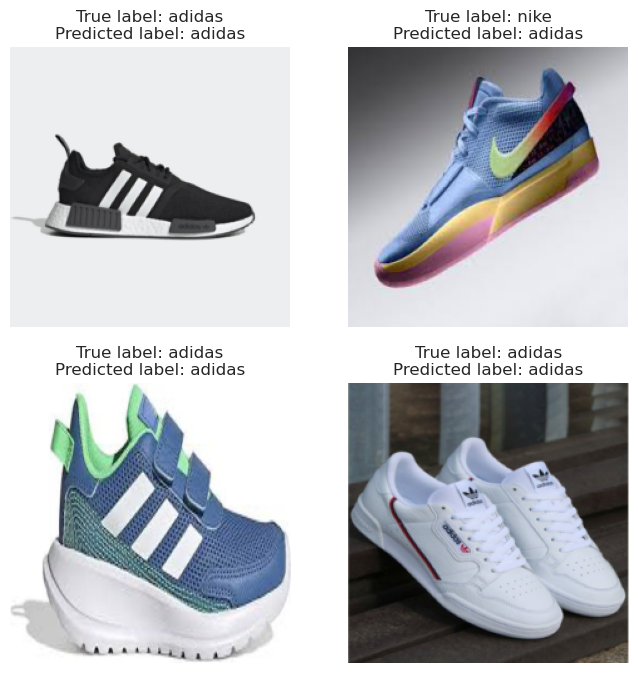

In [60]:
# Generate predictions for number of examples from the test set
num_examples = 4
x, y_true = test_data.next()
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(8, 8))
for i in range(num_examples):
    # Get a random image and its corresponding label from the test set
    x_test = x[i]
    y_true_test = y_true[i]

    # Get the model's prediction for the random image
    y_pred_test = head_model.predict(np.expand_dims(x_test, axis=0))[0]
    
    true_label = class_names[int(y_true_test)]
    predicted_label = class_names[int(np.argmax(y_pred_test))]

    # Plot the image and predicted label in a subplot
    ax[i//2, i%2].imshow(x_test)
    ax[i//2, i%2].axis('off')
    ax[i//2, i%2].set_title(f"True label: {true_label}\nPredicted label: {predicted_label}");

plt.show()

**The model is suffering from overfitting, so we'll custom ResNet Model with additional data agumentation layer and try to change some of hayperparameter values.**

# **Cutomized ResNet Model**

In [91]:
# Define data augmentation layers to preprocess input images
data_augmentation_layer = tf.keras.Sequential([                                       # Randomly flip inputs horizontally and vertically
  tf.keras.layers.RandomFlip('horizontal_and_vertical', input_shape=(224, 224, 3)),   # Randomly rotate inputs by up to 20%
  tf.keras.layers.RandomRotation(0.2),                                                # Randomly zoom into inputs by up to 20%
  tf.keras.layers.RandomZoom(0.2),                                                    # Randomly adjust the width of inputs by up to 20%
  tf.keras.layers.RandomWidth(0.2),                                                   # Randomly adjust the height of inputs by up to 20%
  tf.keras.layers.RandomHeight(0.2),                                                  # Randomly adjust the contrast of inputs by up to 20%
  tf.keras.layers.RandomContrast(0.2) 
], name='data_augmentation')

In [93]:
# Load the ResNet152 pre-trained model with imagenet weights and excluding top layers
base_model = tf.keras.applications.ResNet152(weights='imagenet', include_top=False, input_shape=(224,224,3))

# Set all layers of the base model to be non-trainable
for layer in base_model.layers:
    layer.trainable = False

# Create the head model by stacking the data augmentation layer, base model, and other layers
head_model1 = tf.keras.Sequential([
    data_augmentation_layer,   # add data augmentation layer here
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Flatten(),
    layers.Dense(1000, activation='relu'),
    layers.Dense(10, activation='softmax')
])

# Output the number of layers in the base model
print("Number of layers in the base model: ", len(base_model.layers))


Number of layers in the base model:  515


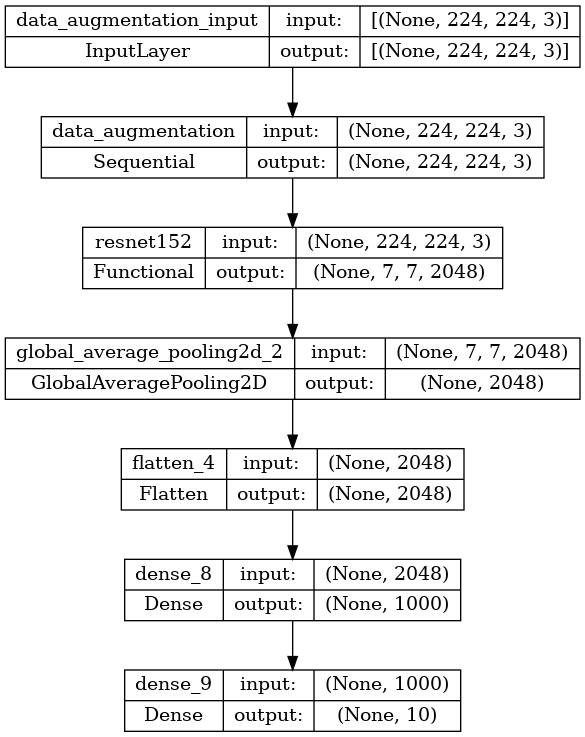

In [94]:
# Import the required library
from keras.utils.vis_utils import plot_model

# Visualize the model architecture and save the plot as an image
plot_model(head_model1, show_shapes=True, show_layer_names=True)

In [96]:
#Compile Model
head_model1.compile(optimizer='adam', loss=losses.sparse_categorical_crossentropy, metrics=['accuracy'])

# Define a learning rate scheduler that reduces the learning rate by a factor of 0.1 when the monitored metric plateaus
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(factor=0.1, patience=3)

# Define early stopping to stop training when monitored metric stops improving
# Here, the patience is set to 2, which means training will stop if the metric does not improve for 2 epochs
# restore_best_weights is set to False, which means that the weights at the end of the epoch with the best monitored metric won't be restored
early_stopping = tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)

In [97]:
# Train model 
# Use early stopping and learning rate reduction callbacks
history = head_model1.fit(train_dataset, epochs=9, validation_data=val_dataset,
                          callbacks=[lr_scheduler, early_stopping])

Epoch 1/9
15/15 [==============================] - 116s 7s/step - loss: 2.3067 - accuracy: 0.5696 - val_loss: 1.7656 - val_accuracy: 0.6174 - lr: 0.0010
Epoch 2/9
15/15 [==============================] - 100s 7s/step - loss: 0.9999 - accuracy: 0.7130 - val_loss: 0.5094 - val_accuracy: 0.8087 - lr: 0.0010
Epoch 3/9
15/15 [==============================] - 95s 7s/step - loss: 0.5095 - accuracy: 0.7870 - val_loss: 0.6014 - val_accuracy: 0.7478 - lr: 0.0010
Epoch 4/9
15/15 [==============================] - 99s 7s/step - loss: 0.4294 - accuracy: 0.8065 - val_loss: 0.3636 - val_accuracy: 0.8696 - lr: 0.0010
Epoch 5/9
15/15 [==============================] - 97s 6s/step - loss: 0.3695 - accuracy: 0.8413 - val_loss: 0.3775 - val_accuracy: 0.8522 - lr: 0.0010
Epoch 6/9
15/15 [==============================] - 103s 7s/step - loss: 0.4236 - accuracy: 0.8435 - val_loss: 0.3380 - val_accuracy: 0.8783 - lr: 0.0010
Epoch 7/9
15/15 [==============================] - 98s 7s/step - loss: 0.3373 - accur

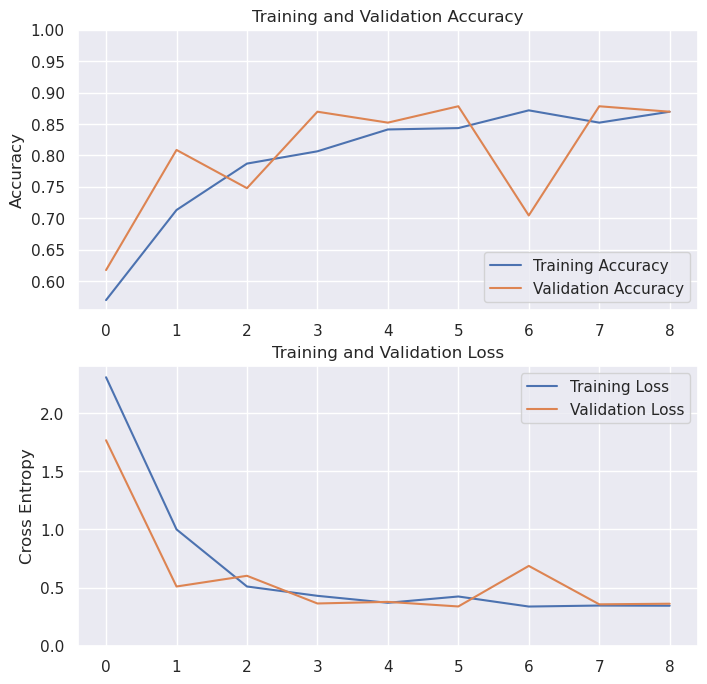

In [98]:
# Extract training and validation accuracy
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# Extract training and validation loss
loss = history.history['loss']
val_loss = history.history['val_loss']

# ________________ Graph 1 -------------------------

# Plot training and validation accuracy
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()), 1])
plt.title('Training and Validation Accuracy')

# ________________ Graph 2 -------------------------

# Plot training and validation loss
plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0, max(plt.ylim())])
plt.title('Training and Validation Loss')
plt.show()


In [99]:
# Evaluate the model on the test dataset
head_model1.evaluate(test_data)

1/1 [==============================] - 7s 7s/step - loss: 1.0575 - accuracy: 0.4545


[1.0575309991836548, 0.4545454680919647]

1/1 [==============================] - 0s 291ms/step


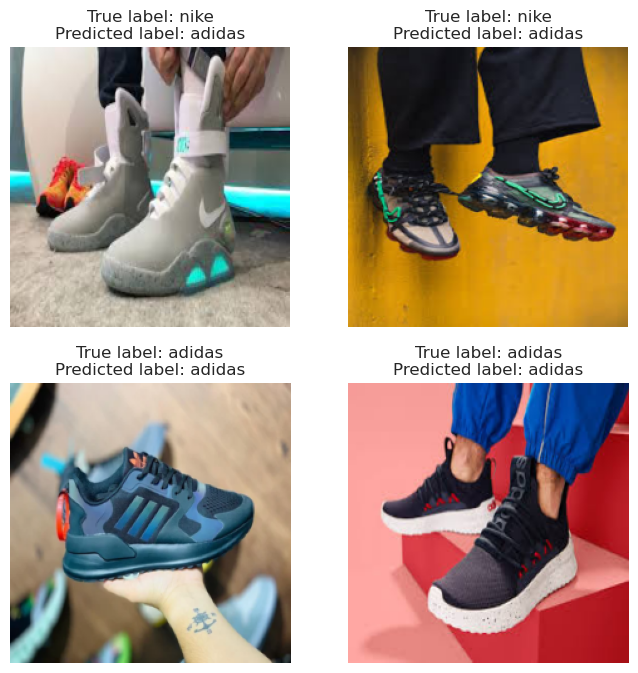

In [100]:
# Generate predictions for number of examples from the test set
num_examples = 4
x, y_true = test_data.next()
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(8, 8))
for i in range(num_examples):
    # Get a random image and its corresponding label from the test set
    x_test = x[i]
    y_true_test = y_true[i]

    # Get the model's prediction for the random image
    y_pred_test = head_model.predict(np.expand_dims(x_test, axis=0))[0]
    
    true_label = class_names[int(y_true_test)]
    predicted_label = class_names[int(np.argmax(y_pred_test))]

    # Plot the image and predicted label in a subplot
    ax[i//2, i%2].imshow(x_test)
    ax[i//2, i%2].axis('off')
    ax[i//2, i%2].set_title(f"True label: {true_label}\nPredicted label: {predicted_label}");

plt.show()

# **Inception_v3 Model**

In [101]:
preprocess_input = tf.keras.applications.inception_v3.preprocess_input 

In [104]:
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Input, Lambda

# Define a function that resizes the images to the required shape
def resize_images(image):
    return tf.image.resize(image, (224, 224))

# Create a custom input layer that applies the resizing function to the input images
input_layer = Input(shape=(None, None, 3))
resized_input = Lambda(resize_images)(input_layer)

# Pass the resized input to the InceptionV3 model
base_model = tf.keras.applications.InceptionV3(input_tensor=resized_input, include_top=False, weights='imagenet')

#To train the parameters ==> True..... to Freeze parameters ==> False 
base_model.trainable = True

In [106]:
input_shape = IMG_SIZE + (3,)

# create the input layer (Same as the InceptionV3 input size)
inputs = tf.keras.Input(shape=input_shape)

# reshape the input tensor to have a batch size of 1
x = tf.reshape(inputs, [-1, input_shape[0], input_shape[1], input_shape[2]])

# set training to False to avoid keeping track of statistics in the batch norm layer
x = base_model(x, training=False)

# add the new Binary classification layers
# use global avg pooling to summarize the info in each channel
x = tfl.GlobalAveragePooling2D()(x) 
# include dropout with probability of 0.5 to avoid overfitting
x = tfl.Dropout(0.1)(x)

# use a prediction layer with one neuron (as a binary classifier only needs one)
outputs = tfl.Dense(1)(x)
# create model 
model = tf.keras.Model(inputs, outputs)
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_19 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 tf.reshape (TFOpLambda)     (None, 224, 224, 3)       0         
                                                                 
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 global_average_pooling2d_4   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_2 (Dropout)         (None, 2048)              0         
                                                                 
 dense_11 (Dense)            (None, 1)                 2049      
                                                           

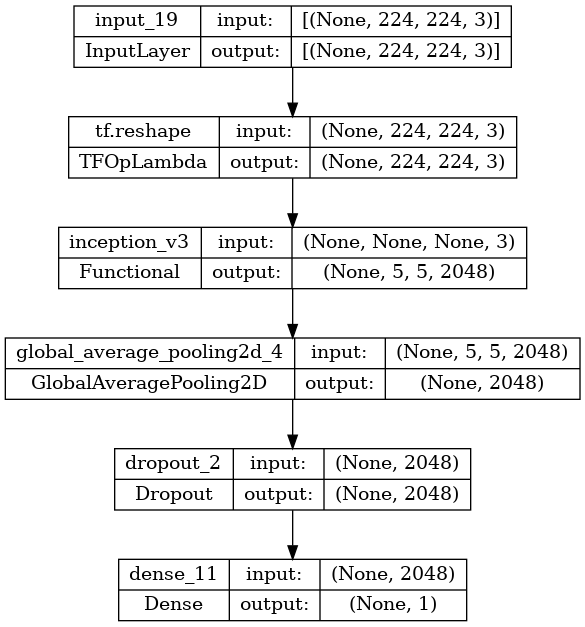

In [107]:
from keras.utils.vis_utils import plot_model
plot_model(model, show_shapes=True, show_layer_names=True)

In [115]:
# Set base_model as the whole model
base_model = model

# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(base_model.layers))

# Fine-tune from this layer onwards
fine_tune_at = 240

# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

learning_rate = 0.0001

# Define a BinaryCrossentropy loss function. Use from_logits=True
loss_function = tf.losses.BinaryCrossentropy(from_logits=True)

# Define an Adam optimizer with a learning rate 
optimizer = tf.optimizers.Adam(learning_rate=learning_rate)

# Use accuracy as evaluation metric
metrics=['accuracy']

# Put all these hyperparameters in the model
model.compile(loss=loss_function,
              optimizer=optimizer,
              metrics=metrics)

# Define early stopping based on validation loss
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

Number of layers in the base model:  6


In [116]:
#number of epochs = 10
epochs =  10

#train model
history = model.fit(train_dataset,
                    epochs=epochs,
                    validation_data=val_dataset,
                    callbacks=[early_stopping])

Epoch 1/10
15/15 [==============================] - 27s 2s/step - loss: 14.9387 - accuracy: 0.4522 - val_loss: 10.9864 - val_accuracy: 0.5826
Epoch 2/10
15/15 [==============================] - 22s 1s/step - loss: 14.6169 - accuracy: 0.4848 - val_loss: 10.9864 - val_accuracy: 0.5826
Epoch 3/10
15/15 [==============================] - 22s 1s/step - loss: 14.7287 - accuracy: 0.4826 - val_loss: 10.9864 - val_accuracy: 0.5826
Epoch 4/10
15/15 [==============================] - 22s 1s/step - loss: 14.2870 - accuracy: 0.4913 - val_loss: 10.9864 - val_accuracy: 0.5826


# Inception_v3 Evaluation

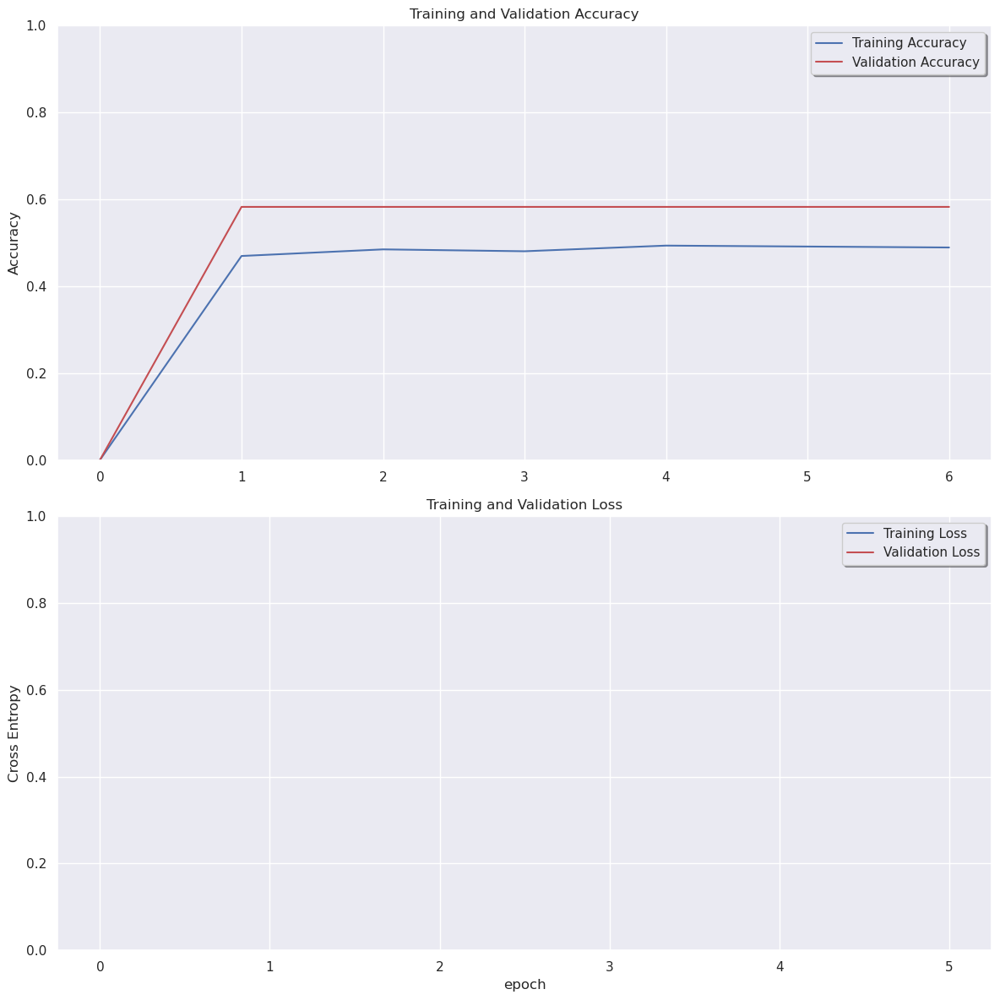

In [114]:
# Extract training and validation accuracy
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# Extract training and validation loss
loss = history.history['loss']
val_loss = history.history['val_loss']

# ________________ Graph 1 -------------------------

# Plot training and validation accuracy
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()), 1])
plt.title('Training and Validation Accuracy')

# ________________ Graph 2 -------------------------

# Plot training and validation loss
plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0, max(plt.ylim())])
plt.title('Training and Validation Loss')
plt.show()


# Inception_v3 Generalization

In [117]:
# Evaluate the model on the test dataset
model.evaluate(val_data)

1/1 [==============================] - 2s 2s/step - loss: 0.7549 - accuracy: 0.4545


[0.7548742890357971, 0.4545454680919647]

1/1 [==============================] - 0s 80ms/step


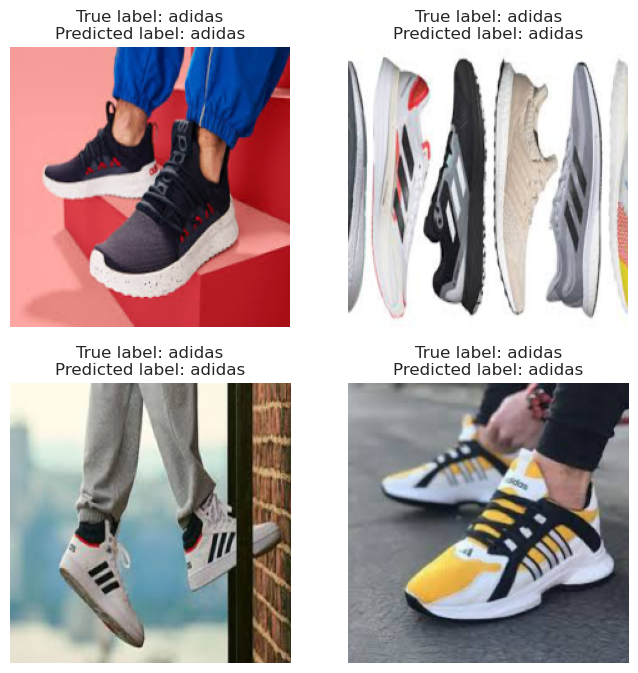

In [118]:
# Generate predictions for number of examples from the test set
num_examples = 4
x, y_true = test_data.next()
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(8, 8))
for i in range(num_examples):
    # Get a random image and its corresponding label from the test set
    x_test = x[i]
    y_true_test = y_true[i]

    # Get the model's prediction for the random image
    y_pred_test = model.predict(np.expand_dims(x_test, axis=0))[0]
    
    true_label = class_names[int(y_true_test)]
    predicted_label = class_names[int(np.argmax(y_pred_test))]

    # Plot the image and predicted label in a subplot
    ax[i//2, i%2].imshow(x_test)
    ax[i//2, i%2].axis('off')
    ax[i//2, i%2].set_title(f"True label: {true_label}\nPredicted label: {predicted_label}");

plt.show()

**inception_v3 shows the best performance.**